In [1]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from os import listdir
from os.path import isfile, join
onlyfiles = [f for f in listdir('./data') if isfile(join('./data', f))]

In [19]:
periods = []
FFs = []
thetas = []
xs = []
sources = []

S11s = []
S12s = []

fiber_0 = []
fiber_1 = []
wav_0 = []
wav_1 = []

for file in onlyfiles:
    dbfile = open('./data/' + file, 'rb')
    db = pickle.load(dbfile)
    
    params = db['params']
    
    periods.append(params['a'])
    FFs.append(params['FF'])
    thetas.append(params['theta'])
    xs.append(params['x'])
    sources.append(params['source'])
    
    res_fiber = db['res_fiber']
    res_waveguide = db['res_waveguide']
    
    fiber_0.append(res_fiber.alpha[0,0,0])
    fiber_1.append(res_fiber.alpha[0,0,1])
    wav_0.append(res_waveguide.alpha[0,0,0])
    wav_1.append(res_waveguide.alpha[0,0,1])
    
    if params['source']==0:
        S11s.append(np.abs(res_fiber.alpha[0,0,1])**2/np.abs(res_fiber.alpha[0,0,0])**2)
        S12s.append(np.abs(res_waveguide.alpha[0,0,1])**2/np.abs(res_fiber.alpha[0,0,0])**2)
    else:
        S11s.append(np.abs(res_waveguide.alpha[0,0,1])**2/np.abs(res_waveguide.alpha[0,0,0])**2)
        S12s.append(np.abs(res_fiber.alpha[0,0,1])**2/np.abs(res_waveguide.alpha[0,0,0])**2)
        
    dbfile.close()

In [20]:
import pandas as pd

dict_arr = {'period': periods, 
        'FF': FFs, 
        'theta': thetas,
        'x': xs, 
        'source':sources,
        'S11': S11s, 
        'S12': S12s,
        'fiber_0':fiber_0,
        'fiber_1':fiber_1,
        'wav_0':wav_0,
        'wav_1':wav_1
       } 
df = pd.DataFrame(dict_arr)
df 

,period,FF,theta,x,source,S11,S12,fiber_0,fiber_1,wav_0,wav_1
0,0.6,0.689474,0.139626,0.0,1,0.471946,0.000073,0.000024+0.000041j,-0.017326-0.015109j,-2.103309-1.669305j,0.786797-1.668506j
1,0.6,0.563158,0.139626,5.0,0,0.186898,0.000314,-6.045377+2.020605j,1.636771-2.216875j,0.000886+0.000605j,0.028012+0.109347j
2,0.6,0.436842,0.139626,0.0,0,0.162595,0.030621,-6.045464+2.019559j,1.715484-1.913825j,0.003776-0.005288j,0.985391-0.522529j
3,0.6,0.773684,0.139626,5.0,1,0.199206,0.000014,0.000002+0.000048j,0.007680+0.006634j,-2.100825-1.665460j,0.817885-0.873387j
4,0.6,0.563158,0.139626,3.0,0,0.183249,0.000761,-6.045125+2.020535j,1.634549-2.184707j,0.000540-0.000047j,0.136116-0.111284j
...,...,...,...,...,...,...,...,...,...,...,...
205,0.6,0.100000,0.139626,3.0,1,0.234872,0.003798,-0.000423+0.000433j,0.115370-0.118571j,-2.104989-1.665699j,0.194726-1.286259j
206,0.6,0.268421,0.139626,5.0,1,0.120758,0.001886,0.000377-0.000077j,-0.107801+0.044125j,-2.104017-1.663765j,0.182001-0.914182j
207,0.6,0.563158,0.139626,2.0,1,0.154689,0.001835,-0.000410+0.000040j,0.114068-0.014098j,-2.104169-1.664459j,0.216796-1.032686j
208,0.6,0.184211,0.139626,4.0,0,0.151644,0.000240,-6.041850+2.021283j,0.550550-2.419098j,0.000043+0.000267j,-0.062400+0.076548j


In [22]:
np.max(np.abs(df['S12'].to_numpy()))

0.04477137760176561

In [23]:
df.loc[df['S12'] == np.max(df['S12'].to_numpy())]

,period,FF,theta,x,source,S11,S12,fiber_0,fiber_1,wav_0,wav_1
51,0.6,0.310526,0.139626,1.0,0,0.09808,0.044771,-6.044002+2.018843j,1.18335-1.60695j,0.006320+0.004808j,0.529622+1.239949j


In [24]:
df.loc[np.abs(df['FF'] - 0.310526) < 0.001]

,period,FF,theta,x,source,S11,S12,fiber_0,fiber_1,wav_0,wav_1
49,0.6,0.310526,0.139626,4.0,1,0.055183,0.000986,-0.000022+0.000307j,-0.020692-0.081623j,-2.104359-1.661581j,-0.054072-0.627530j
51,0.6,0.310526,0.139626,1.0,0,0.098080,0.044771,-6.044002+2.018843j,1.183350-1.606950j,0.006320+0.004808j,0.529622+1.239949j
62,0.6,0.310526,0.139626,1.0,1,0.055191,0.002865,0.000225+0.000387j,-0.074953-0.122378j,-2.104360-1.661581j,-0.054134-0.627574j
116,0.6,0.310526,0.139626,4.0,0,0.093742,0.003435,-6.044636+2.018104j,1.359450-1.399569j,0.002256+0.000296j,0.334656+0.165877j
121,0.6,0.310526,0.139626,2.0,1,0.055191,0.001366,0.000159-0.000208j,-0.058659+0.079870j,-2.104359-1.661581j,-0.054123-0.627572j
134,0.6,0.310526,0.139626,2.0,0,0.093458,0.030972,-6.043839+2.018668j,1.221588-1.517359j,-0.005735+0.003534j,-1.119719+0.061681j
136,0.6,0.310526,0.139626,0.0,1,0.055191,0.005371,-0.000622+0.000093j,0.193303-0.035268j,-2.104360-1.661581j,-0.054135-0.627572j
141,0.6,0.310526,0.139626,5.0,0,0.093013,0.001096,-6.044240+2.018212j,1.342287-1.405394j,-0.000497+0.001011j,-0.136038+0.161239j
144,0.6,0.310526,0.139626,3.0,1,0.055175,0.001394,-0.000304+0.000020j,0.099259+0.013070j,-2.104359-1.661581j,-0.054076-0.627486j
162,0.6,0.310526,0.139626,5.0,1,0.055181,0.000499,0.000223+0.000019j,-0.055890+0.021461j,-2.104359-1.661581j,-0.054068-0.627523j


In [25]:
np.abs(0.529622+1.239949j)**2 / np.abs(-6.044002+2.018843j)**2

0.04477138817967197

In [26]:
np.abs(-0.074953-0.122378j)**2 / np.abs(-2.104360-1.661581j)**2

0.002864627138889202

In [34]:
import meep as mp
import math

resolution = 64 # pixels/unit length (1 um)

hSiN = 0.44
hSiO2 = 3.2
hSi = 1
hair = 4

dgrat = 0.6 * 0.310526 	
dgap = 0.6 * (1 - 0.310526)
a = dgrat + dgap
N = 20
N = N+1
dtaper = 12

dbuffer = 0.5
dpml = 1

# Fiber parameters, from SMF-633-4/125-1-L or PMF-633-4/125-0.25-L
fiber_core = 4
fiber_clad = 120
fiber_angle = 8
fiber_angle = np.radians(fiber_angle)
fiber_xposition = 1
fiber_air_gap = 1
hfiber = 3
haircore = 2
hfiber_geom = 100 # Some large number to make fiber extend into PML
# Index from 0.10 @ 633 nm numerical aperture
# cladding 635 nm real index, From NA, n=1.4535642400664652
nClad = 1.4535642400664652
Clad = mp.Medium(index=nClad)
# Pure fused silica core core 635 nm real index (will be SiO2 below)

# MEEP's computational cell is always centered at (0,0), but code has beginning of grating at (0,0)
sxy = 2*dpml + dtaper + a*N + 2*dbuffer # sx here
sz = 2*dbuffer + hSiO2 + hSiN + hair + hSi + 2*dpml # sy here
# comp_origin_x = dpml + dbuffer + dtaper
comp_origin_x = 0
# meep_origin_x = sxy/2
# x_offset = meep_origin_x - comp_origin_x
x_offset = 0
# comp_origin_y = dpml + hSi + hSiO2 + hSiN/2
comp_origin_y = 0
# meep_origin_y = sz/2
# y_offset = meep_origin_y - comp_origin_y
y_offset = 0

# x_offset_vector = mp.Vector3(x_offset,0)
# offset_vector = mp.Vector3(x_offset, y_offset)
offset_vector = mp.Vector3(0,0,0)

# Si3N4 635 nm real index
nSiN = 2.0102
SiN = mp.Medium(index=nSiN)
# SiO2 635 nm real index
nSiO2 = 1.4569
SiO2 = mp.Medium(index=nSiO2)
# Si substrate 635 nm complex index, following https://meep.readthedocs.io/en/latest/Materials/#conductivity-and-complex
# eps = 15.044 + i*0.14910
Si = mp.Medium(epsilon=15.044, D_conductivity=2*math.pi*0.635*0.14910/15.044)

# We will do x-z plane simulation
cell_size = mp.Vector3(sxy,sz)

geometry = []

# Fiber (defined first to be overridden)

# Core
# fiber_offset = mp.Vector3(fiber_xposition + extrax, hSiN/2 + hair + haircore + extray) - offset_vector
geometry.append(mp.Block(material=Clad, 
                         center=mp.Vector3(x=fiber_xposition) - offset_vector, 
                         size=mp.Vector3(fiber_clad, hfiber_geom),
                         e1=mp.Vector3(x=1).rotate(mp.Vector3(z=1), -1*fiber_angle),
                         e2=mp.Vector3(y=1).rotate(mp.Vector3(z=1), -1*fiber_angle),
                        )
               )
geometry.append(mp.Block(material=SiO2, 
                         center=mp.Vector3(x=fiber_xposition) - offset_vector, 
                         size=mp.Vector3(fiber_core, hfiber_geom),
                         e1=mp.Vector3(x=1).rotate(mp.Vector3(z=1), -1*fiber_angle),
                         e2=mp.Vector3(y=1).rotate(mp.Vector3(z=1), -1*fiber_angle),
                        )
               )

# air
geometry.append(mp.Block(material=mp.air, center=mp.Vector3(0,haircore/2)-offset_vector, size=mp.Vector3(mp.inf,haircore)))

# waveguide
geometry.append(mp.Block(material=SiN, center=mp.Vector3(0,0)-offset_vector, size=mp.Vector3(mp.inf,hSiN)))

# grating etch
for n in range(0,N):
    geometry.append(mp.Block(material=mp.air, center=mp.Vector3(n*a+dgap/2,0)-offset_vector, size=mp.Vector3(dgap,hSiN)))
    
geometry.append(mp.Block(material=mp.air, center=mp.Vector3(sxy-comp_origin_x-0.5*(dpml + dbuffer),0)-offset_vector, size=mp.Vector3(dpml + dbuffer,hSiN)))    

# BOX
geometry.append(mp.Block(material=SiO2, center=mp.Vector3(0,-0.5*(hSiN + hSiO2))-offset_vector, size=mp.Vector3(mp.inf,hSiO2)))

# Substrate
geometry.append(mp.Block(material=Si, center=mp.Vector3(0,-0.5*(hSiN + hSi + dpml + dbuffer) - hSiO2)-offset_vector, size=mp.Vector3(mp.inf,hSi+dpml+dbuffer)))

# PMLs
boundary_layers = [ mp.PML(dpml) ]

# Source 

# mode frequency
fcen = 1/0.635

waveguide_port_center = mp.Vector3(-1*dtaper,0)-offset_vector
waveguide_port_size = mp.Vector3(0,2*haircore-0.1)
fiber_port_center = mp.Vector3((0.5*sz-dpml+y_offset - 1)*np.sin(fiber_angle) + fiber_xposition, 0.5*sz-dpml+y_offset - 1)-offset_vector
fiber_port_size = mp.Vector3(sxy*3/5-2*dpml - 2,0)

# Waveguide source
# sources = [mp.EigenModeSource(src=mp.GaussianSource(fcen, fwidth=0.1*fcen),
#                               size=waveguide_port_size,
#                               center=waveguide_port_center,
#                               eig_band=1,
#                               direction=mp.X,
#                               eig_match_freq=True,
#                               eig_parity=mp.ODD_Z)]

# Fiber source
sources = [mp.EigenModeSource(src=mp.GaussianSource(fcen, fwidth=0.1*fcen),
                              size=fiber_port_size,
                              center=fiber_port_center,
                              eig_band=1,
                              direction=mp.NO_DIRECTION,
                              eig_kpoint=mp.Vector3(y=-1).rotate(mp.Vector3(z=1), -1*fiber_angle),
                              eig_match_freq=True,
                              eig_parity=mp.ODD_Z)]

#symmetries = [mp.Mirror(mp.Y,-1)]
symmetries = []

sim = mp.Simulation(resolution=resolution,
                    cell_size=cell_size,
                    boundary_layers=boundary_layers,
                    geometry=geometry,
                    #geometry_center=mp.Vector3(x_offset, y_offset),
                    sources=sources,
                    dimensions=2,
                    symmetries=symmetries,
                    eps_averaging=False)

# Ports
waveguide_monitor_port = mp.ModeRegion(center=waveguide_port_center+mp.Vector3(x=0.2), size=waveguide_port_size)
waveguide_monitor = sim.add_mode_monitor(fcen, 0, 1, waveguide_monitor_port, yee_grid=True)
fiber_monitor_port = mp.ModeRegion(center=fiber_port_center-mp.Vector3(y=0.2), size=fiber_port_size, direction=mp.NO_DIRECTION)
fiber_monitor = sim.add_mode_monitor(fcen, 0, 1, fiber_monitor_port)

# nearfield = sim.add_near2far(fcen, 0, 1, mp.Near2FarRegion(mp.Vector3(x_offset,0.5*sz-dpml+y_offset)-offset_vector, size=mp.Vector3(sxy-2*dpml,0)))

In [35]:
%%capture
sim.init_sim()

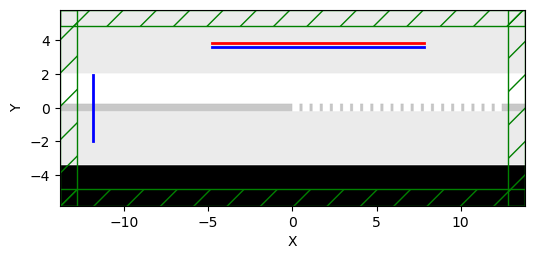

In [36]:
f = plt.figure(dpi=100)
sim.plot2D(ax=f.gca())
plt.show()

In [37]:
f = plt.figure(dpi=100)
animate = mp.Animate2D(sim,mp.Ez,f=f,normalize=True)
sim.run(mp.at_every(1,animate), until=100)
plt.close()

Meep progress: 1.0/100.0 = 1.0% done in 4.8s, 475.2s to go
on time step 128 (time=1), 0.0375019 s/step
Meep progress: 3.1796875/100.0 = 3.2% done in 8.8s, 268.3s to go
on time step 407 (time=3.17969), 0.0143691 s/step
Meep progress: 5.1953125/100.0 = 5.2% done in 12.8s, 234.0s to go
on time step 665 (time=5.19531), 0.0155492 s/step
Meep progress: 6.953125/100.0 = 7.0% done in 16.8s, 225.2s to go
on time step 890 (time=6.95312), 0.0178144 s/step
Meep progress: 8.703125/100.0 = 8.7% done in 20.8s, 218.6s to go
on time step 1114 (time=8.70312), 0.0178728 s/step
Meep progress: 10.7109375/100.0 = 10.7% done in 24.8s, 207.1s to go
on time step 1371 (time=10.7109), 0.015608 s/step
Meep progress: 12.828125/100.0 = 12.8% done in 28.9s, 196.0s to go
on time step 1642 (time=12.8281), 0.0147663 s/step
Meep progress: 15.015625/100.0 = 15.0% done in 32.9s, 186.0s to go
on time step 1922 (time=15.0156), 0.0143294 s/step
Meep progress: 17.25/100.0 = 17.2% done in 36.9s, 176.9s to go
on time step 2208 

In [38]:
animate.to_jshtml(10)

In [39]:
import meep as mp
import math

resolution = 64 # pixels/unit length (1 um)

hSiN = 0.44
hSiO2 = 3.2
hSi = 1
hair = 4

dgrat = 0.6 * 0.310526 	
dgap = 0.6 * (1 - 0.310526)
a = dgrat + dgap
N = 20
N = N+1
dtaper = 12

dbuffer = 0.5
dpml = 1

# Fiber parameters, from SMF-633-4/125-1-L or PMF-633-4/125-0.25-L
fiber_core = 4
fiber_clad = 120
fiber_angle = 8
fiber_angle = np.radians(fiber_angle)
fiber_xposition = 1
fiber_air_gap = 1
hfiber = 3
haircore = 2
hfiber_geom = 100 # Some large number to make fiber extend into PML
# Index from 0.10 @ 633 nm numerical aperture
# cladding 635 nm real index, From NA, n=1.4535642400664652
nClad = 1.4535642400664652
Clad = mp.Medium(index=nClad)
# Pure fused silica core core 635 nm real index (will be SiO2 below)

# MEEP's computational cell is always centered at (0,0), but code has beginning of grating at (0,0)
sxy = 2*dpml + dtaper + a*N + 2*dbuffer # sx here
sz = 2*dbuffer + hSiO2 + hSiN + hair + hSi + 2*dpml # sy here
# comp_origin_x = dpml + dbuffer + dtaper
comp_origin_x = 0
# meep_origin_x = sxy/2
# x_offset = meep_origin_x - comp_origin_x
x_offset = 0
# comp_origin_y = dpml + hSi + hSiO2 + hSiN/2
comp_origin_y = 0
# meep_origin_y = sz/2
# y_offset = meep_origin_y - comp_origin_y
y_offset = 0

# x_offset_vector = mp.Vector3(x_offset,0)
# offset_vector = mp.Vector3(x_offset, y_offset)
offset_vector = mp.Vector3(0,0,0)

# Si3N4 635 nm real index
nSiN = 2.0102
SiN = mp.Medium(index=nSiN)
# SiO2 635 nm real index
nSiO2 = 1.4569
SiO2 = mp.Medium(index=nSiO2)
# Si substrate 635 nm complex index, following https://meep.readthedocs.io/en/latest/Materials/#conductivity-and-complex
# eps = 15.044 + i*0.14910
Si = mp.Medium(epsilon=15.044, D_conductivity=2*math.pi*0.635*0.14910/15.044)

# We will do x-z plane simulation
cell_size = mp.Vector3(sxy,sz)

geometry = []

# Fiber (defined first to be overridden)

# Core
# fiber_offset = mp.Vector3(fiber_xposition + extrax, hSiN/2 + hair + haircore + extray) - offset_vector
geometry.append(mp.Block(material=Clad, 
                         center=mp.Vector3(x=fiber_xposition) - offset_vector, 
                         size=mp.Vector3(fiber_clad, hfiber_geom),
                         e1=mp.Vector3(x=1).rotate(mp.Vector3(z=1), -1*fiber_angle),
                         e2=mp.Vector3(y=1).rotate(mp.Vector3(z=1), -1*fiber_angle),
                        )
               )
geometry.append(mp.Block(material=SiO2, 
                         center=mp.Vector3(x=fiber_xposition) - offset_vector, 
                         size=mp.Vector3(fiber_core, hfiber_geom),
                         e1=mp.Vector3(x=1).rotate(mp.Vector3(z=1), -1*fiber_angle),
                         e2=mp.Vector3(y=1).rotate(mp.Vector3(z=1), -1*fiber_angle),
                        )
               )

# air
geometry.append(mp.Block(material=mp.air, center=mp.Vector3(0,haircore/2)-offset_vector, size=mp.Vector3(mp.inf,haircore)))

# waveguide
geometry.append(mp.Block(material=SiN, center=mp.Vector3(0,0)-offset_vector, size=mp.Vector3(mp.inf,hSiN)))

# grating etch
for n in range(0,N):
    geometry.append(mp.Block(material=mp.air, center=mp.Vector3(n*a+dgap/2,0)-offset_vector, size=mp.Vector3(dgap,hSiN)))
    
geometry.append(mp.Block(material=mp.air, center=mp.Vector3(sxy-comp_origin_x-0.5*(dpml + dbuffer),0)-offset_vector, size=mp.Vector3(dpml + dbuffer,hSiN)))    

# BOX
geometry.append(mp.Block(material=SiO2, center=mp.Vector3(0,-0.5*(hSiN + hSiO2))-offset_vector, size=mp.Vector3(mp.inf,hSiO2)))

# Substrate
geometry.append(mp.Block(material=Si, center=mp.Vector3(0,-0.5*(hSiN + hSi + dpml + dbuffer) - hSiO2)-offset_vector, size=mp.Vector3(mp.inf,hSi+dpml+dbuffer)))

# PMLs
boundary_layers = [ mp.PML(dpml) ]

# Source 

# mode frequency
fcen = 1/0.635

waveguide_port_center = mp.Vector3(-1*dtaper,0)-offset_vector
waveguide_port_size = mp.Vector3(0,2*haircore-0.1)
fiber_port_center = mp.Vector3((0.5*sz-dpml+y_offset - 1)*np.sin(fiber_angle) + fiber_xposition, 0.5*sz-dpml+y_offset - 1)-offset_vector
fiber_port_size = mp.Vector3(sxy*3/5-2*dpml - 2,0)

# Waveguide source
sources = [mp.EigenModeSource(src=mp.GaussianSource(fcen, fwidth=0.1*fcen),
                              size=waveguide_port_size,
                              center=waveguide_port_center,
                              eig_band=1,
                              direction=mp.X,
                              eig_match_freq=True,
                              eig_parity=mp.ODD_Z)]

# # Fiber source
# sources = [mp.EigenModeSource(src=mp.GaussianSource(fcen, fwidth=0.1*fcen),
#                               size=fiber_port_size,
#                               center=fiber_port_center,
#                               eig_band=1,
#                               direction=mp.NO_DIRECTION,
#                               eig_kpoint=mp.Vector3(y=-1).rotate(mp.Vector3(z=1), -1*fiber_angle),
#                               eig_match_freq=True,
#                               eig_parity=mp.ODD_Z)]

#symmetries = [mp.Mirror(mp.Y,-1)]
symmetries = []

sim = mp.Simulation(resolution=resolution,
                    cell_size=cell_size,
                    boundary_layers=boundary_layers,
                    geometry=geometry,
                    #geometry_center=mp.Vector3(x_offset, y_offset),
                    sources=sources,
                    dimensions=2,
                    symmetries=symmetries,
                    eps_averaging=False)

# Ports
waveguide_monitor_port = mp.ModeRegion(center=waveguide_port_center+mp.Vector3(x=0.2), size=waveguide_port_size)
waveguide_monitor = sim.add_mode_monitor(fcen, 0, 1, waveguide_monitor_port, yee_grid=True)
fiber_monitor_port = mp.ModeRegion(center=fiber_port_center-mp.Vector3(y=0.2), size=fiber_port_size, direction=mp.NO_DIRECTION)
fiber_monitor = sim.add_mode_monitor(fcen, 0, 1, fiber_monitor_port)

# nearfield = sim.add_near2far(fcen, 0, 1, mp.Near2FarRegion(mp.Vector3(x_offset,0.5*sz-dpml+y_offset)-offset_vector, size=mp.Vector3(sxy-2*dpml,0)))

In [40]:
%%capture
sim.init_sim()

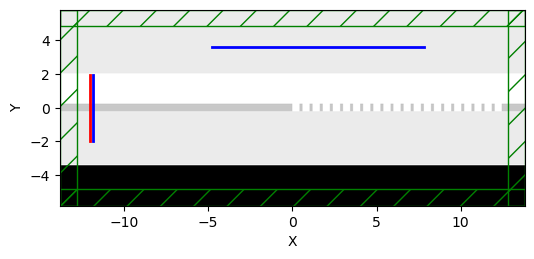

In [41]:
f = plt.figure(dpi=100)
sim.plot2D(ax=f.gca())
plt.show()

In [42]:
f = plt.figure(dpi=100)
animate = mp.Animate2D(sim,mp.Ez,f=f,normalize=True)
sim.run(mp.at_every(1,animate), until=100)
plt.close()

Meep progress: 1.0/100.0 = 1.0% done in 4.8s, 475.1s to go
on time step 128 (time=1), 0.0374894 s/step
Meep progress: 3.5625/100.0 = 3.6% done in 8.8s, 238.3s to go
on time step 456 (time=3.5625), 0.0122024 s/step
Meep progress: 5.75/100.0 = 5.8% done in 12.8s, 210.0s to go
on time step 736 (time=5.75), 0.0143114 s/step
Meep progress: 7.78125/100.0 = 7.8% done in 16.8s, 199.2s to go
on time step 996 (time=7.78125), 0.0153888 s/step
Meep progress: 9.7890625/100.0 = 9.8% done in 20.8s, 191.9s to go
on time step 1253 (time=9.78906), 0.0156046 s/step
Meep progress: 12.0/100.0 = 12.0% done in 24.9s, 182.3s to go
on time step 1536 (time=12), 0.0142497 s/step
Meep progress: 14.265625/100.0 = 14.3% done in 28.9s, 173.4s to go
on time step 1826 (time=14.2656), 0.0138058 s/step
Meep progress: 16.5078125/100.0 = 16.5% done in 32.9s, 166.2s to go
on time step 2113 (time=16.5078), 0.013943 s/step
Meep progress: 18.671875/100.0 = 18.7% done in 36.9s, 160.6s to go
on time step 2390 (time=18.6719), 0.

In [43]:
animate.to_jshtml(10)

In [45]:
neff = 1.93*0.310526 + (1 - 0.310526)
neff

1.28878918

In [46]:
635 / (neff - np.sin(8 * np.pi/180))

552.3583147256431